# Internship Test

- Name: **Huỳnh Trí Nhân**
- Mail: **huynhtrinhan6282710@gmail.com**

## Topic
Fine-tuning YOLOv11n-OBB (pretrained on DOTA-v1) for few-shot object detection on YOLODIOR-R dataset (aerial images)

### Key features:
- **Base Model**: YOLOv11n-OBB pretrained on DOTA-v1
- **Target Dataset**: YOLODIOR-R (20 classes) aerial images
- **Learning Approach**: Few-shot learning with k-shot per class
- **Augmentations**: Tiling, Rotation, Copy-Paste
- **Framework**: PyTorch + Ultralytics


### YOLODIOR-R Dataset:
- **Classes**: 20 categories (airplane, airport, baseballfield, etc.)
- **Format**: Rotated bounding boxes (OBB)
- **Challenge**: Few-shot transfer learning from DOTA-v1


In [1]:
import sys
print("Python path:", sys.executable)

Python path: /venv/main/bin/python


In [ ]:
# https://drive.google.com/file/d/1D2XEd7Vz9EyZPVB48sSJyddBzRtG77Er/view?usp=sharing

In [2]:
!pip install -q gdown

In [3]:
!gdown --id 1D2XEd7Vz9EyZPVB48sSJyddBzRtG77Er

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1D2XEd7Vz9EyZPVB48sSJyddBzRtG77Er
From (redirected): https://drive.google.com/uc?id=1D2XEd7Vz9EyZPVB48sSJyddBzRtG77Er&confirm=t&uuid=edafc00d-4a03-49cd-bb2a-889505c4fa03
To: /archive.zip
100%|██████████████████████████████████████| 7.42G/7.42G [02:46<00:00, 44.5MB/s]


In [4]:
packages = [
    "torch==2.6.0+cu124",
    "torchvision==0.21.0",
    "pandas==2.2.2",
    "numpy==1.26.4",
    "opencv-python==4.9.0.80",
    "requests==2.32.2",
    "pillow==11.3.0",
    "PyYAML==6.0.2",
    "ultralytics==8.3.186",
    "matplotlib",
    "seaborn"
]

! /venv/main/bin/python -m pip install -q --extra-index-url https://download.pytorch.org/whl/cu124 {' '.join(packages)}

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.7.1+cu128 requires torch==2.7.1, but you have torch 2.6.0+cu124 which is incompatible.


In [5]:
%pip install -q ultralytics

Note: you may need to restart the kernel to use updated packages.


In [1]:
import os
import sys
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import cv2
from PIL import Image
import requests
import json
import random
import shutil
from collections import defaultdict, Counter
from typing import Dict, List, Tuple, Optional
import math
import yaml  

# Ultralytics YOLO
from ultralytics import YOLO

# PyTorch
import torch
import torchvision
print(f"PyTorch: {torch.__version__}")
print(f"Torchvision: {torchvision.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA version: {torch.version.cuda}")
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")


# Set random seeds
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

set_seed(42)

PyTorch: 2.6.0+cu124
Torchvision: 0.21.0+cu124
CUDA available: True
CUDA version: 12.4
GPU: NVIDIA GeForce RTX 4090
GPU memory: 23.5 GB


## 1. Setup Dataset
- Dowload dataset from [Kaggle: YOLODIOR-R](https://www.kaggle.com/datasets/redzapdos123/dior-r-dataset-yolov11-obb-format)
### YOLODIOR-R vs DOTA-v1 Comparison:

**DOTA-v1 Classes (15):**
```
plane, ship, storage-tank, baseball-diamond, tennis-court, 
basketball-court, ground-track-field, harbor, bridge, 
large-vehicle, small-vehicle, helicopter, roundabout, 
soccer-ball-field, swimming-pool
```

**YOLODIOR-R Classes (20):**
```
airplane, airport, baseballfield, basketballcourt, bridge, 
chimney, dam, Expressway-Service-area, Expressway-toll-station, 
golffield, groundtrackfield, harbor, overpass, ship, stadium, 
storagetank, tenniscourt, trainstation, vehicle, windmill
```


In [ ]:
YOLODIOR_ROOT = Path("YOLODIOR-R")
OUTPUT_ROOT = Path("./output")
MODELS_DIR = Path("./models")
FEW_SHOT_K = [5,10]
SEEDS = [0]


OUTPUT_ROOT.mkdir(exist_ok=True)
MODELS_DIR.mkdir(exist_ok=True)

print(f"YOLODIOR-R path: {YOLODIOR_ROOT.absolute()}")
print(f"Output path: {OUTPUT_ROOT.absolute()}")

# DOTA-v1 classes (pretrained model of YOLOv11n-OBB)
DOTA_CLASSES = [
    'plane', 'ship', 'storage-tank', 'baseball-diamond', 
    'tennis-court', 'basketball-court', 'ground-track-field',
    'harbor', 'bridge', 'large-vehicle', 'small-vehicle',
    'helicopter', 'roundabout', 'soccer-ball-field', 'swimming-pool'
]

# YOLODIOR-R classes
YOLODIOR_CLASSES = [
    'airplane', 'airport', 'baseballfield', 'basketballcourt', 
    'bridge', 'chimney', 'dam', 'Expressway-Service-area',
    'Expressway-toll-station', 'golffield', 'groundtrackfield', 
    'harbor', 'overpass', 'ship', 'stadium', 'storagetank',
    'tenniscourt', 'trainstation', 'vehicle', 'windmill'
]

print(f"\nDOTA-v1: {len(DOTA_CLASSES)} classes")
print(f"YOLODIOR-R: {len(YOLODIOR_CLASSES)} classes")

# Class mapping  DOTA and YOLODIOR-R
CLASS_MAPPING = {

    'plane': 'airplane',
    'ship': 'ship', 
    'baseball-diamond': 'baseballfield',
    'tennis-court': 'tenniscourt',
    'basketball-court': 'basketballcourt',
    'ground-track-field': 'groundtrackfield',
    'harbor': 'harbor',
    'bridge': 'bridge',
    'storage-tank': 'storagetank',
    'large-vehicle': 'vehicle',
    'small-vehicle': 'vehicle',  # map cho cả 2 loài 'vehicle'
    
    # New classes in YOLODIOR-R (no DOTA equivalent)
    # 'airport', 'chimney', 'dam', 'Expressway-Service-area',
    # 'Expressway-toll-station', 'golffield', 'overpass', 
    # 'stadium', 'trainstation', 'windmill'
}

YOLODIOR-R path: /YOLODIOR-R
Output path: /output

DOTA-v1: 15 classes
YOLODIOR-R: 20 classes


In [3]:
def analyze_yolodior_dataset(dataset_path: Path) -> Dict:
    """Analyze YOLODIOR-R dataset structure and statistics"""
    
    if not dataset_path.exists():
        print(f"Dataset not found at: {dataset_path}")
        return {}
    
    print(f"Analyzing YOLODIOR-R dataset at: {dataset_path}")
    
    stats = {
        'train': {'images': 0, 'labels': 0, 'class_distribution': Counter()},
        'val': {'images': 0, 'labels': 0, 'class_distribution': Counter()},
        'test': {'images': 0, 'labels': 0, 'class_distribution': Counter()}
    }
    
    for split in ['train', 'val', 'test']:
        images_dir = dataset_path / split / "images"
        labels_dir = dataset_path / split / "labels"
        
        if not images_dir.exists():
            print(f"{split}/images directory not found")
            continue
            
        # Count images
        image_files = list(images_dir.glob("*.jpg")) + list(images_dir.glob("*.png"))
        stats[split]['images'] = len(image_files)
        
        if labels_dir.exists():
            label_files = list(labels_dir.glob("*.txt"))
            stats[split]['labels'] = len(label_files)
            
            # Parse label files to get class distribution
            for label_file in label_files:
                try:
                    with open(label_file, 'r') as f:
                        lines = f.readlines()
                    
                    for line in lines:
                        if line.strip():
                            parts = line.strip().split()
                            if len(parts) >= 9:  # OBB format: class x1 y1 x2 y2 x3 y3 x4 y4
                                class_id = int(parts[0])
                                if 0 <= class_id < len(YOLODIOR_CLASSES):
                                    class_name = YOLODIOR_CLASSES[class_id]
                                    stats[split]['class_distribution'][class_name] += 1
                except Exception as e:
                    print(f"Error reading {label_file}: {e}")
    
    return stats


dataset_stats = analyze_yolodior_dataset(YOLODIOR_ROOT)
print(f"Training set: {dataset_stats['train']['images']} images, {dataset_stats['train']['labels']} labels")
print(f"Validation set: {dataset_stats['val']['images']} images, {dataset_stats['val']['labels']} labels")
print(f"Test set: {dataset_stats['test']['images']} images, {dataset_stats['test']['labels']} labels")


Analyzing YOLODIOR-R dataset at: YOLODIOR-R
Training set: 18770 images, 18770 labels
Validation set: 2346 images, 2346 labels
Test set: 2347 images, 2347 labels


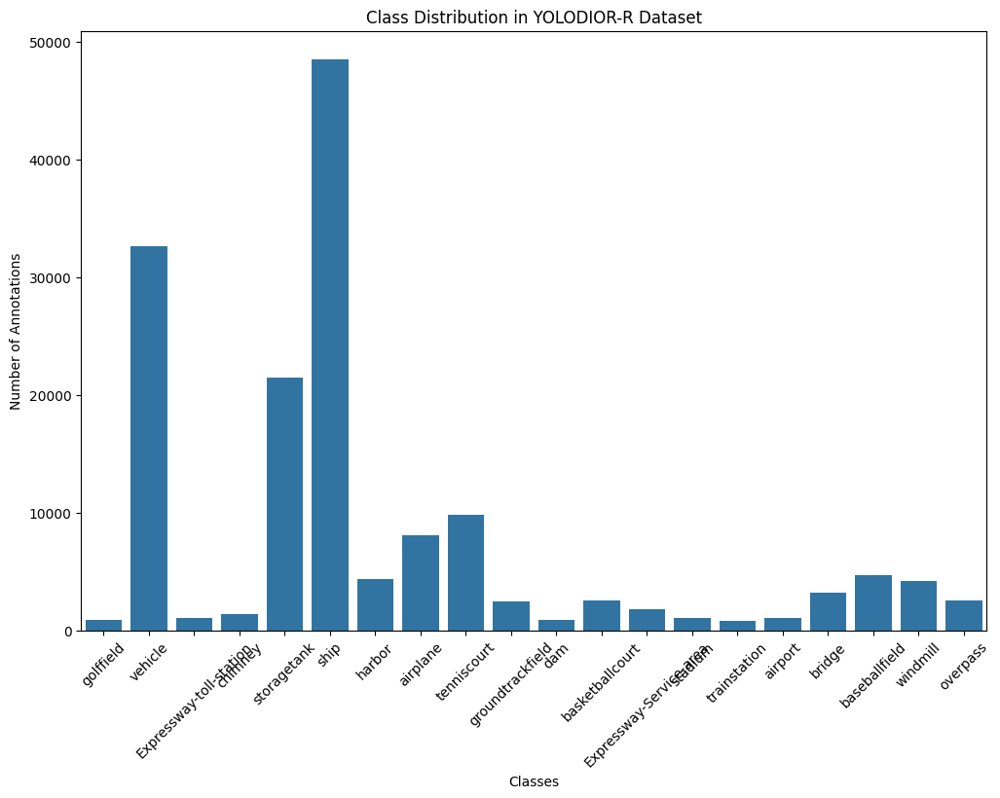

In [4]:
# bar chart of the class distribution
def plot_class_distribution(stats: Dict):
    plt.figure(figsize=(12, 8))
    sns.barplot(x=list(stats['class_distribution'].keys()), y=list(stats['class_distribution'].values()))
    plt.xlabel('Classes')
    plt.ylabel('Number of Annotations')
    plt.xticks(rotation=45)
    plt.title('Class Distribution in YOLODIOR-R Dataset')
    plt.show()
plot_class_distribution(dataset_stats['train'])

In [5]:
def img_show(img, labels, hide_label=False, caption=None):
    """
    img: ảnh numpy (BGR)
    labels: list[(cls:int, quad:[8 floats normalized])]
    """
    vis = img.copy()
    H, W = vis.shape[:2]

    for cls, quad in labels:
        class_name = YOLODIOR_CLASSES[cls] if 0 <= cls < len(YOLODIOR_CLASSES) else str(cls)
        # normalized -> pixel
        pts = np.array([(quad[i]*W, quad[i+1]*H) for i in range(0,8,2)], dtype=np.int32).reshape(-1,2)
        cv2.polylines(vis, [pts], True, (0,0,255), 2, lineType=cv2.LINE_AA)
        if not hide_label:
            tl = pts.min(axis=0)
            cv2.putText(vis, class_name, (int(tl[0]), int(max(0, tl[1]-6))),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2, cv2.LINE_AA)

    vis_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,8))
    plt.imshow(vis_rgb)
    if caption is not None:
        plt.title(caption, fontsize=14, color="blue")
    plt.axis("off")
    plt.show()
    
def _parse_label_line(line: str):
    parts = line.strip().split()
    if len(parts) < 9:
        return None
    cls = int(float(parts[0]))
    quad = [float(x) for x in parts[1:9]]
    return (cls, quad)

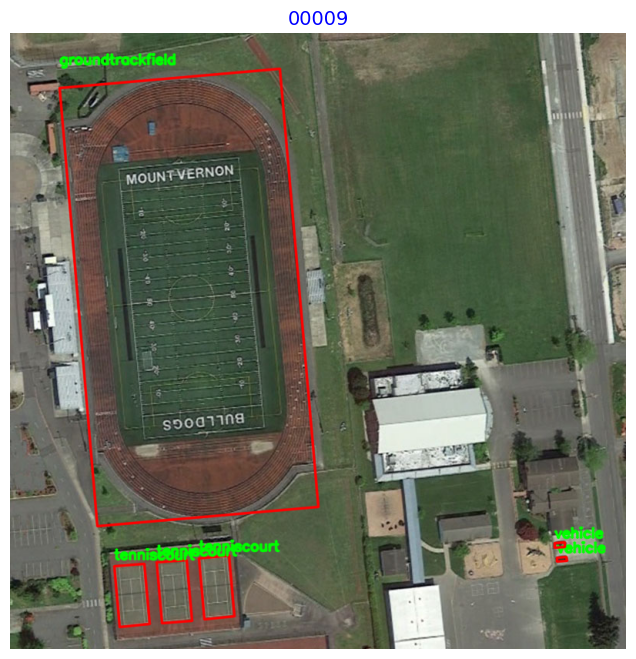

In [6]:
name_id = "00009"
img_path = YOLODIOR_ROOT / "train" / "images" / f"{name_id}.jpg"
label_path = YOLODIOR_ROOT / "train" / "labels" / f"{name_id}.txt"

img = cv2.imread(str(img_path))
if img is None:
    raise FileNotFoundError(f"Can not read {img_path}")

with open(label_path, 'r') as f:
    lines = [l.strip() for l in f if l.strip()]

labels = [_parse_label_line(l) for l in lines if _parse_label_line(l) is not None]

img_show(img, labels, hide_label=False, caption=name_id)

## 2. Few-Shot Sampling 


In [17]:
class FewShotSampler:
    def __init__(self, dataset_path: Path, output_path: Path):
        self.dataset_path = dataset_path
        self.output_path = output_path
        self.class_samples = defaultdict(list)
        
    def collect_samples_by_class(self, split='train'):
        
        images_dir = self.dataset_path / split / "images"
        labels_dir = self.dataset_path / split / "labels"
        
        if not images_dir.exists() or not labels_dir.exists():
            print(f"Error: {split} directories not found")
            return
        # Lấy tất cả file
        image_files = list(images_dir.glob("*.jpg")) + list(images_dir.glob("*.png"))
        
        # duyệt từng file ảnh và lấy các class có trong file ảnh
        for img_file in image_files:
            label_file = labels_dir / f"{img_file.stem}.txt"
            
            if not label_file.exists():
                continue
                
            try:
                with open(label_file, 'r') as f:
                    lines = f.readlines()
                
                image_classes = set()
                # annotation chứa các class có trong file ảnh
                annotations = []
                
                for line in lines:
                    if line.strip():
                        parts = line.strip().split()
                        if len(parts) >= 9:
                            class_id = int(parts[0])
                            if 0 <= class_id < len(YOLODIOR_CLASSES):
                                class_name = YOLODIOR_CLASSES[class_id]
                                image_classes.add(class_name)
                                annotations.append({
                                    'class_id': class_id,
                                    'class_name': class_name,
                                    'coords': [float(x) for x in parts[1:9]]
                                })
                
                # Với mỗi class có trong file ảnh, thêm vào class_samples
                for class_name in image_classes:
                    self.class_samples[class_name].append({
                        'image_path': img_file,
                        'label_path': label_file,
                        'image_name': img_file.name,
                        'annotations': [ann for ann in annotations if ann['class_name'] == class_name],
                        'all_annotations': annotations
                    })
                    
            except Exception as e:
                print(f"Error processing {img_file}: {e}")
        
        print(f"Collected samples for {len(self.class_samples)} classes")
        for class_name, samples in self.class_samples.items():
            print(f"  {class_name}: {len(samples)} samples")
    
    def create_k_shot_split(self, k: int, seed: int = 42):
        """Create k-shot split for each class"""
        random.seed(seed)
        np.random.seed(seed)
        
        
        selected_samples = {}
        for class_name, samples in self.class_samples.items():
            if len(samples) >= k:
                selected = random.sample(samples, k)
                selected_samples[class_name] = selected
            else:
                selected_samples[class_name] = samples
               
        
        return selected_samples
    
    def save_few_shot_dataset(self, selected_samples: Dict, k: int, seed: int):
        
        output_dir = self.output_path / f"{k}shot_seed{seed}"
        output_dir.mkdir(parents=True, exist_ok=True)
        
        train_img_dir = output_dir / "train" / "images"
        train_lbl_dir = output_dir / "train" / "labels"
        # val_img_dir = output_dir / "val" / "images"
        # val_lbl_dir = output_dir / "val" / "labels"
        test_img_dir = output_dir / "test" / "images"
        test_lbl_dir = output_dir / "test" / "labels"
        
        for dir_path in [train_img_dir, train_lbl_dir, test_img_dir, test_lbl_dir]:
            dir_path.mkdir(parents=True, exist_ok=True)
        
        # Copy few-shot training samples
        copied_files = set()
        total_samples = 0
        
        for class_name, samples in selected_samples.items():
            for sample in samples:
                img_name = sample['image_name']
                
                if img_name not in copied_files:
                    # Copy image to train
                    src_img = sample['image_path']
                    dst_img = train_img_dir / img_name
                    shutil.copy2(src_img, dst_img)
                    
                    # Copy label to train
                    src_lbl = sample['label_path']
                    dst_lbl = train_lbl_dir / f"{src_img.stem}.txt"
                    shutil.copy2(src_lbl, dst_lbl)
                    
                    copied_files.add(img_name)
                    total_samples += 1
        
        # original val set
        # orig_val_img_dir = self.dataset_path / "val" / "images"
        # orig_val_lbl_dir = self.dataset_path / "val" / "labels"
        
        # if orig_val_img_dir.exists():
        #     for img_file in orig_val_img_dir.glob("*.jpg"):
        #         shutil.copy2(img_file, val_img_dir / img_file.name)
                
        #         lbl_file = orig_val_lbl_dir / f"{img_file.stem}.txt"
        #         if lbl_file.exists():
        #             shutil.copy2(lbl_file, val_lbl_dir / f"{img_file.stem}.txt")
        
        # original test set
        orig_test_img_dir = self.dataset_path / "test" / "images"
        orig_test_lbl_dir = self.dataset_path / "test" / "labels"
        
        if orig_test_img_dir.exists():
            for img_file in orig_test_img_dir.glob("*.jpg"):
                shutil.copy2(img_file, test_img_dir / img_file.name)
                
                lbl_file = orig_test_lbl_dir / f"{img_file.stem}.txt"
                if lbl_file.exists():
                    shutil.copy2(lbl_file, test_lbl_dir / f"{img_file.stem}.txt")
        
        data_yaml = {
            'path': str(output_dir.absolute()),
            'train': 'train/images',       # Few-shot training data
            'val': 'train/images',
            'test': 'test/images',         # Original test data
            'nc': len(YOLODIOR_CLASSES),
            'names': {i: name for i, name in enumerate(YOLODIOR_CLASSES)}
        }
        
        with open(output_dir / "data.yaml", 'w') as f:
            yaml.dump(data_yaml, f, default_flow_style=False)
        print(f" ====== Sampling {k}-shot data with seed {seed} ======")
        print(f"   Train: {total_samples} few-shot samples")
        print(f"   Val: {len(list(train_img_dir.glob('*.jpg')))} original samples")
        print(f"   Test: {len(list(test_img_dir.glob('*.jpg')))} original samples")
        
        return output_dir

In [18]:
sampler = FewShotSampler(YOLODIOR_ROOT, OUTPUT_ROOT / "few_shot_datasets")
sampler.collect_samples_by_class()

# tạo nhiều shot trên nhiều seeds
k_shots = FEW_SHOT_K
seeds = SEEDS

few_shot_datasets = {}

for k in k_shots:
    few_shot_datasets[k] = {}
    for seed in seeds:
        selected_samples = sampler.create_k_shot_split(k, seed)
        dataset_path = sampler.save_few_shot_dataset(selected_samples, k, seed)
        few_shot_datasets[k][seed] = {
            'path': dataset_path,
            'samples': selected_samples,
            'total_samples': sum(len(samples) for samples in selected_samples.values())
        }


Collected samples for 20 classes
  golffield: 760 samples
  Expressway-toll-station: 985 samples
  vehicle: 5185 samples
  chimney: 669 samples
  storagetank: 1341 samples
  ship: 2139 samples
  harbor: 1179 samples
  airplane: 1115 samples
  groundtrackfield: 1818 samples
  tenniscourt: 2064 samples
  dam: 792 samples
  basketballcourt: 1092 samples
  Expressway-Service-area: 904 samples
  stadium: 978 samples
  trainstation: 792 samples
  airport: 1052 samples
  bridge: 1734 samples
  baseballfield: 1957 samples
  windmill: 1282 samples
  overpass: 1628 samples
 ====== Sampling 5-shot data with seed 0 ======
   Train: 100 few-shot samples
   Val: 100 original samples
   Test: 2347 original samples
 ====== Sampling 10-shot data with seed 0 ======
   Train: 200 few-shot samples
   Val: 200 original samples
   Test: 2347 original samples


## 3. Augmentation Pipeline

### Chiến lược cho Aerial Images:
1. **Tiling**: Chia ảnh lớn thành các tiles nhỏ hơn
2. **Rotation**: Xoay ảnh và bounding boxes (0°, 90°, 180°, 270°)
3. **Copy-Paste**: Copy objects từ ảnh này sang ảnh khác
4. **Standard Augmentations**: Flip, brightness, contrast, etc.

### Lợi ích:
- Tăng data diversity trong few-shot learning
- Preserve object orientation cho aerial images
- Better generalization với limited samples


In [19]:
def quad_norm_to_pix(quad: List[float], W: int, H: int) -> np.ndarray:
    """[x1,y1,...,x4,y4] normalized -> (4,2) pixel"""
    pts = np.array(quad, dtype=np.float32).reshape(4, 2)
    pts[:, 0] *= W
    pts[:, 1] *= H
    return pts

def quad_pix_to_norm(pts: np.ndarray, W: int, H: int) -> List[float]:
    """(4,2) pixel -> [x1,y1,...,x4,y4] normalized"""
    q = pts.astype(np.float32).copy()
    q[:, 0] = np.clip(q[:, 0] / max(W, 1e-6), 0, 1)
    q[:, 1] = np.clip(q[:, 1] / max(H, 1e-6), 0, 1)
    return q.reshape(-1).tolist()

def sort_quad_ccw_top_left(pts: np.ndarray) -> np.ndarray:
    """Sort polygon 4 đỉnh theo CCW, bắt đầu từ top-left"""
    c = pts.mean(axis=0)
    ang = np.arctan2(pts[:, 1] - c[1], pts[:, 0] - c[0])
    order = np.argsort(ang)          # CCW quanh tâm
    pts = pts[order]
    start = np.argmin(pts[:, 0] + pts[:, 1])  # top-left = min(x+y)
    return np.roll(pts, -start, axis=0)

def clip_quad_to_image(pts: np.ndarray, W: int, H: int) -> np.ndarray:
    pts[:, 0] = np.clip(pts[:, 0], 0, W - 1)
    pts[:, 1] = np.clip(pts[:, 1], 0, H - 1)
    return pts

# ----------------- Geometric transforms -----------------
def hflip_image_and_quads(img: np.ndarray, quads_norm: List[List[float]]) -> Tuple[np.ndarray, List[List[float]]]:
    H, W = img.shape[:2]
    img_flipped = cv2.flip(img, 1)
    new_quads = []
    for q in quads_norm:
        pts = quad_norm_to_pix(q, W, H)
        pts[:, 0] = W - 1 - pts[:, 0]
        pts = sort_quad_ccw_top_left(pts)
        pts = clip_quad_to_image(pts, W, H)
        new_quads.append(quad_pix_to_norm(pts, W, H))
    return img_flipped, new_quads

def vflip_image_and_quads(img: np.ndarray, quads_norm: List[List[float]]) -> Tuple[np.ndarray, List[List[float]]]:
    H, W = img.shape[:2]
    img_flipped = cv2.flip(img, 0)
    new_quads = []
    for q in quads_norm:
        pts = quad_norm_to_pix(q, W, H)
        pts[:, 1] = H - 1 - pts[:, 1]
        pts = sort_quad_ccw_top_left(pts)
        pts = clip_quad_to_image(pts, W, H)
        new_quads.append(quad_pix_to_norm(pts, W, H))
    return img_flipped, new_quads

def rotate90_image_and_quads(img: np.ndarray,
                              quads_norm: List[List[float]],
                              k: int = 1) -> Tuple[np.ndarray, List[List[float]]]:
    """
    1: 90; 2:180; 3:270 
    """
    H, W = img.shape[:2]
    k = k % 4
    if k == 0:
        return img, quads_norm


    if k == 1:
        img_rot = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
        new_W, new_H = H, W
        R = np.array([[0, 1],
                      [-1, 0]], dtype=np.float32)   # 90 CW
    elif k == 2:
        img_rot = cv2.rotate(img, cv2.ROTATE_180)
        new_W, new_H = W, H
        R = np.array([[-1, 0],
                      [ 0,-1]], dtype=np.float32)   # 180
    else:  # k == 3
        img_rot = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
        new_W, new_H = H, W
        R = np.array([[ 0,-1],
                      [ 1, 0]], dtype=np.float32)   # 270 CW (90 CCW)

    # Quay toạ độ quanh TÂM ảnh gốc, rồi tịnh tiến về TÂM ảnh mới
    cx, cy = (W - 1) / 2.0, (H - 1) / 2.0
    ncx, ncy = (new_W - 1) / 2.0, (new_H - 1) / 2.0

    new_quads = []
    for q in quads_norm:
        pts = quad_norm_to_pix(q, W, H).astype(np.float32)     # (4,2) pixel

        # translate to origin (tâm), rotate, translate to new center
        p0 = pts - np.array([cx, cy], dtype=np.float32)        # (4,2)
        pr = p0 @ R                                            # (4,2)
        pts_r = pr + np.array([ncx, ncy], dtype=np.float32)    # (4,2)

        # sort + clip + về normalized theo kích thước MỚI
        pts_r = sort_quad_ccw_top_left(pts_r)
        pts_r = clip_quad_to_image(pts_r, new_W, new_H)
        new_quads.append(quad_pix_to_norm(pts_r, new_W, new_H))

    return img_rot, new_quads

def letterbox_resize(img: np.ndarray, quads_norm: List[List[float]], out_size: int = 640, scale_up: bool = True) -> Tuple[np.ndarray, List[List[float]]]:
    """Resize giữ tỉ lệ, pad để thành out_size x out_size"""
    H, W = img.shape[:2]
    r = min(out_size / H, out_size / W)
    if not scale_up:
        r = min(r, 1.0)
    new_unpad = (int(round(W * r)), int(round(H * r)))
    dw = (out_size - new_unpad[0]) // 2
    dh = (out_size - new_unpad[1]) // 2

    img_resized = cv2.resize(img, new_unpad, interpolation=cv2.INTER_LINEAR)
    canvas = np.full((out_size, out_size, 3), 114, dtype=img.dtype)
    canvas[dh:dh + new_unpad[1], dw:dw + new_unpad[0]] = img_resized

    new_quads = []
    for q in quads_norm:
        pts = quad_norm_to_pix(q, W, H)
        pts[:, 0] = pts[:, 0] * (new_unpad[0] / W) + dw
        pts[:, 1] = pts[:, 1] * (new_unpad[1] / H) + dh
        pts = sort_quad_ccw_top_left(pts)
        pts = clip_quad_to_image(pts, out_size, out_size)
        new_quads.append(quad_pix_to_norm(pts, out_size, out_size))

    return canvas, new_quads


def adjust_brightness_contrast(img: np.ndarray, alpha: float = 1.0, beta: int = 0) -> np.ndarray:
    return cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

def gaussian_blur(img: np.ndarray, k: int = 3) -> np.ndarray:
    k = max(1, k | 1)  # ensure odd
    return cv2.GaussianBlur(img, (k, k), 0)

def add_gaussian_noise(img: np.ndarray, sigma: float = 10.0) -> np.ndarray:
    noise = np.random.normal(0, sigma, img.shape).astype(np.float32)
    out = img.astype(np.float32) + noise
    return np.clip(out, 0, 255).astype(np.uint8)

class AerialAugmenter:
    """flip H/V, rotate 90/180/270, letterbox resize,
       brightness/contrast, blur, gaussian noise.
       Giữ đúng YOLO-quad normalized labels.
    """
    def __init__(self, out_size=640,
                 p_hflip=0.5, p_vflip=0.5, p_rotate=0.7,
                 p_bc=0.3, p_blur=0.2, p_noise=0.2,
                 rng_seed=None):
        self.out_size = out_size
        self.p_hflip = p_hflip
        self.p_vflip = p_vflip
        self.p_rotate = p_rotate
        self.p_bc = p_bc
        self.p_blur = p_blur
        self.p_noise = p_noise
        if rng_seed is not None:
            random.seed(rng_seed)
            np.random.seed(rng_seed)

    def __call__(self, img: np.ndarray, quads_norm: List[List[float]]):
        # geometric
        if random.random() < self.p_hflip:
            img, quads_norm = hflip_image_and_quads(img, quads_norm)
        if random.random() < self.p_vflip:
            img, quads_norm = vflip_image_and_quads(img, quads_norm)
        if random.random() < self.p_rotate:
            k = random.choice([1, 2, 3])  # 90/180/270
            img, quads_norm = rotate90_image_and_quads(img, quads_norm, k=k)

        # color
        if random.random() < self.p_bc:
            img = adjust_brightness_contrast(img,
                                             alpha=random.uniform(0.85, 1.15),
                                             beta=random.randint(-25, 25))
        if random.random() < self.p_blur:
            img = gaussian_blur(img, k=random.choice([3, 5]))
        if random.random() < self.p_noise:
            img = add_gaussian_noise(img, sigma=random.uniform(5, 15))

        # letterbox cuối cùng
        img, quads_norm = letterbox_resize(img, quads_norm, out_size=self.out_size)
        return img, quads_norm

In [20]:
augmentation = AerialAugmenter()

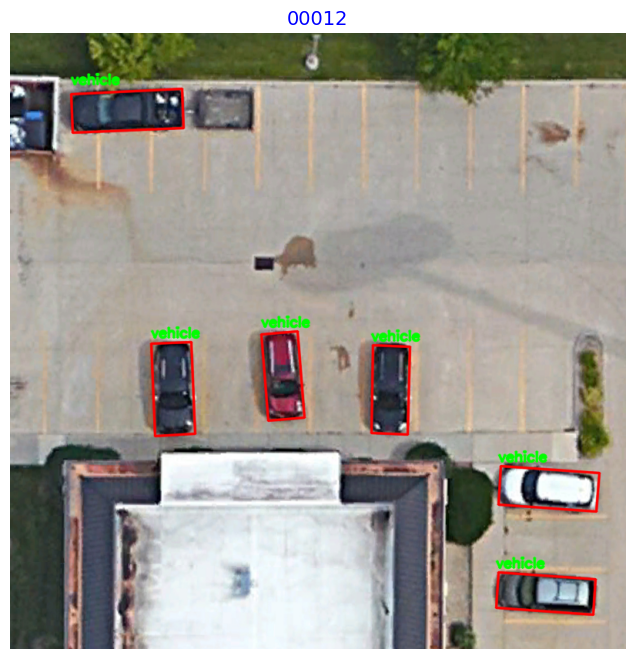

In [21]:
name_id = "00012"
img_path = YOLODIOR_ROOT / "train" / "images" / f"{name_id}.jpg"
label_path = YOLODIOR_ROOT / "train" / "labels" / f"{name_id}.txt"

img = cv2.imread(str(img_path))
if img is None:
    raise FileNotFoundError(f"Can not read {img_path}")

with open(label_path, 'r') as f:
    lines = [l.strip() for l in f if l.strip()]

labels = [_parse_label_line(l) for l in lines if _parse_label_line(l) is not None]

img_show(img, labels, hide_label=False, caption=name_id)

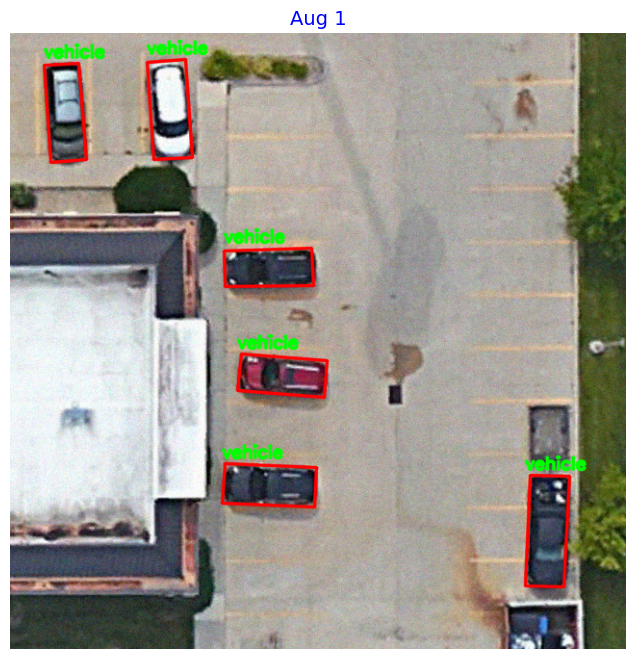

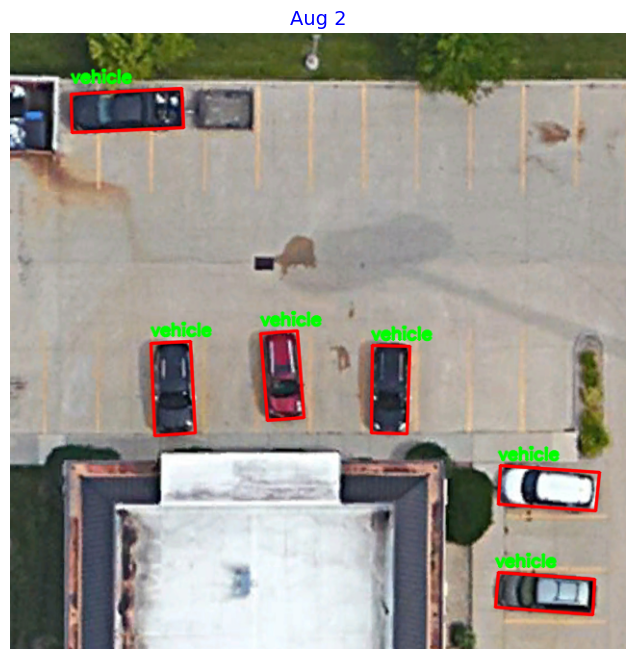

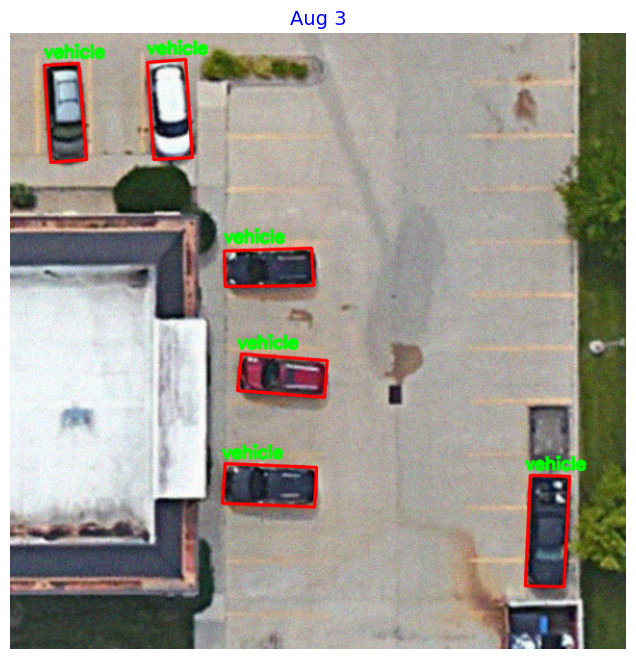

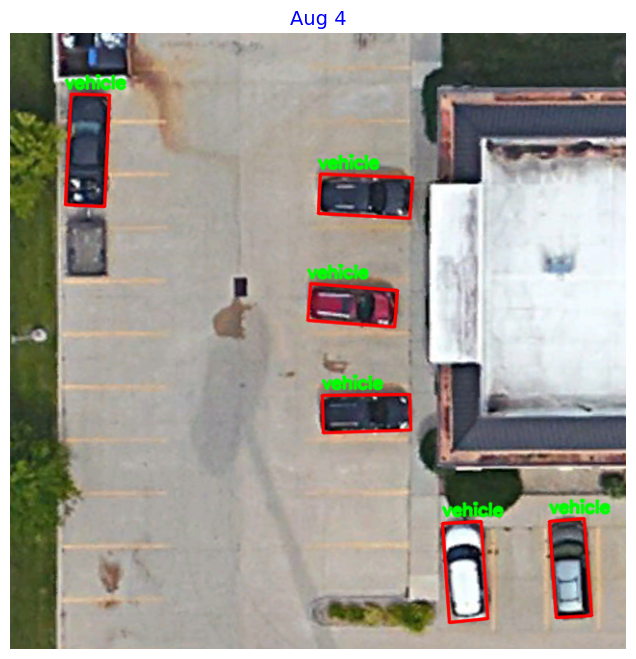

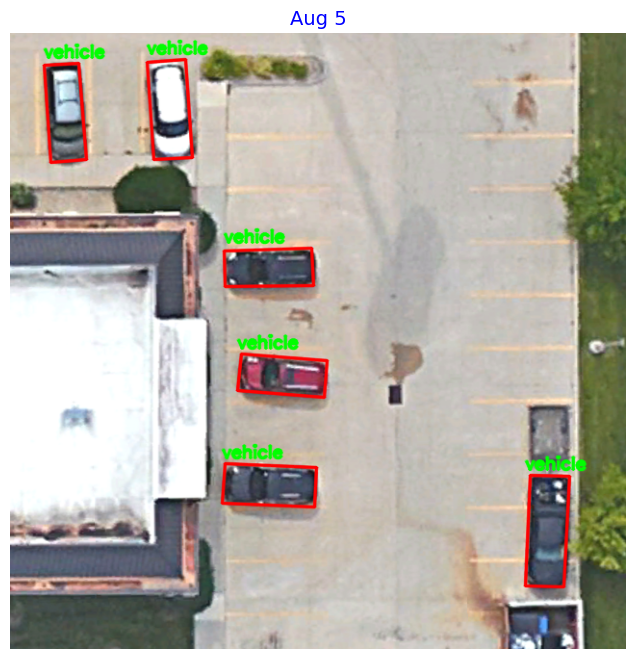

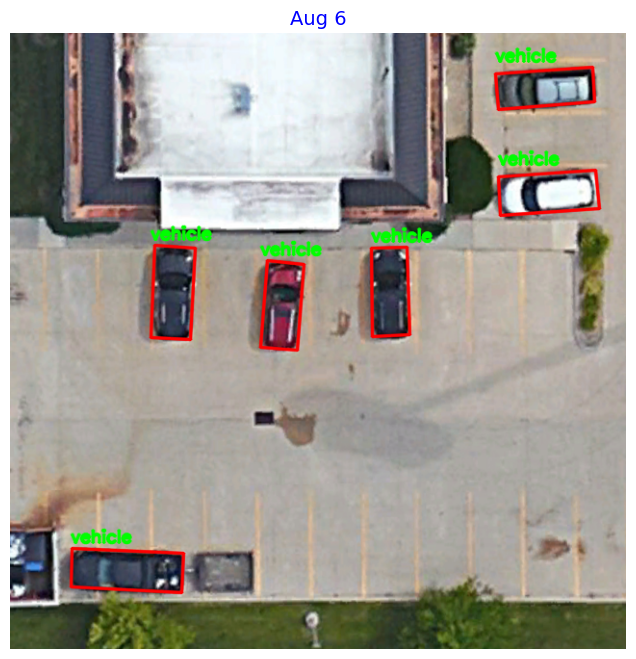

In [22]:
class_ids = [cls for cls, quad in labels]
quads_norm = [quad for cls, quad in labels]

# Sinh nhiều augmentation
n_aug = 6
aug_results = []
for i in range(n_aug):
    aug_img, aug_quads = augmentation(img.copy(), quads_norm.copy())
    aug_results.append((aug_img, list(zip(class_ids, aug_quads))))

# Vẽ từng ảnh
for i, (aug_img, aug_labels) in enumerate(aug_results):
    img_show(aug_img, aug_labels, hide_label=False, caption=f"Aug {i+1}")

In [23]:
def create_augmented_dataset(input_dir: Path, output_dir: Path, augmentation_factor: int = 3):
    """Create augmented version of dataset"""
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Create all directory structures
    aug_img_dir = output_dir / "train" / "images"
    aug_lbl_dir = output_dir / "train" / "labels"
    # val_img_dir = output_dir / "val" / "images"
    # val_lbl_dir = output_dir / "val" / "labels"
    test_img_dir = output_dir / "test" / "images"
    test_lbl_dir = output_dir / "test" / "labels"
    
    for dir_path in [aug_img_dir, aug_lbl_dir, test_img_dir, test_lbl_dir]:
        dir_path.mkdir(parents=True, exist_ok=True)
    
    # Copy original training files first
    orig_img_dir = input_dir / "train" / "images"
    orig_lbl_dir = input_dir / "train" / "labels"
    
    for img_file in orig_img_dir.glob("*.jpg"):
        shutil.copy2(img_file, aug_img_dir / img_file.name)
        
        lbl_file = orig_lbl_dir / f"{img_file.stem}.txt"
        if lbl_file.exists():
            shutil.copy2(lbl_file, aug_lbl_dir / f"{img_file.stem}.txt")
    
    # # origin val set
    # orig_val_img_dir = input_dir / "val" / "images"
    # orig_val_lbl_dir = input_dir / "val" / "labels"
    
    # if orig_val_img_dir.exists():
    #     for img_file in orig_val_img_dir.glob("*.jpg"):
    #         shutil.copy2(img_file, val_img_dir / img_file.name)
            
    #         lbl_file = orig_val_lbl_dir / f"{img_file.stem}.txt"
    #         if lbl_file.exists():
    #             shutil.copy2(lbl_file, val_lbl_dir / f"{img_file.stem}.txt")
    
    #  origin test set
    orig_test_img_dir = input_dir / "test" / "images"
    orig_test_lbl_dir = input_dir / "test" / "labels"
    
    if orig_test_img_dir.exists():
        for img_file in orig_test_img_dir.glob("*.jpg"):
            shutil.copy2(img_file, test_img_dir / img_file.name)
            
            lbl_file = orig_test_lbl_dir / f"{img_file.stem}.txt"
            if lbl_file.exists():
                shutil.copy2(lbl_file, test_lbl_dir / f"{img_file.stem}.txt")
    
    augmenter = AerialAugmenter(out_size=640, rng_seed=42)
    
    for img_file in orig_img_dir.glob("*.jpg"):
        img = cv2.imread(str(img_file))
        if img is None:
            continue
            
        h, w = img.shape[:2]
        lbl_file = orig_lbl_dir / f"{img_file.stem}.txt"
        
        if not lbl_file.exists():
            continue
            
        # Read labels and convert to quad format
        with open(lbl_file, 'r') as f:
            lines = f.readlines()
        
        quads_norm = []
        class_ids = []
        for line in lines:
            if line.strip():
                parts = line.strip().split()
                if len(parts) >= 9:
                    class_ids.append(int(parts[0]))
                    quad = [float(x) for x in parts[1:9]]
                    quads_norm.append(quad)
        
        # Create multiple augmented versions
        for aug_idx in range(augmentation_factor):
            try:
                # Apply augmentation
                aug_img, aug_quads = augmenter(img.copy(), quads_norm.copy())
                
                # Save augmented image
                aug_img_name = f"{img_file.stem}_aug{aug_idx}.jpg"
                cv2.imwrite(str(aug_img_dir / aug_img_name), aug_img)
                
                # Save augmented labels
                aug_labels = []
                for i, quad in enumerate(aug_quads):
                    if i < len(class_ids):
                        label_line = f"{class_ids[i]} " + " ".join([f"{x:.6f}" for x in quad])
                        aug_labels.append(label_line)
                
                aug_lbl_name = f"{img_file.stem}_aug{aug_idx}.txt"
                with open(aug_lbl_dir / aug_lbl_name, 'w') as f:
                    f.write("\n".join(aug_labels))
                    
            except Exception as e:
                print(f"Error augmenting {img_file.name}: {e}")
                continue
    
    print(f"Created augmented dataset at: {output_dir}")
    print(f"  Train: {len(list(aug_img_dir.glob('*.jpg')))} images (original + augmented)")
    print(f"  Val: {len(list(aug_img_dir.glob('*.jpg')))} images (train ing)")
    print(f"  Test: {len(list(test_img_dir.glob('*.jpg')))} images (original test)")
    
    data_yaml = {
        'path': str(output_dir.absolute()),
        'train': 'train/images',       # Augmented training data
        'val': 'train/images', 
        'test': 'test/images',         
        'nc': len(YOLODIOR_CLASSES),
        'names': {i: name for i, name in enumerate(YOLODIOR_CLASSES)}
    }
    
    with open(output_dir / "data.yaml", 'w') as f:
        yaml.dump(data_yaml, f, default_flow_style=False)


## 4. Training Configuration

### Few-Shot Learning Strategy:
1. **Low Learning Rate**: 0.001-0.0001 để tránh catastrophic forgetting
2. **Fewer Epochs**: 50-100 epochs cho few-shot data
3. **Class Balancing**: Weighted sampling cho balanced training
4. **Early Stopping**: Monitor validation để tránh overfitting
5. **Transfer Learning**: Freeze backbone, chỉ fine-tune head

### Hyperparameters for Few-Shot:
- **Learning Rate**: 0.001 (lower than normal)
- **Batch Size**: 8-16 (smaller cho few-shot)
- **Epochs**: 50-100
- **Patience**: 10 epochs early stopping


In [24]:
# Training configuration for few-shot learning
def get_training_config(k_shot: int):
    """Get training configuration based on k-shot scenario"""
    
    base_config = {
        'epochs': 100,
        'imgsz': 640,
        'batch': 16,
        'device': 0 if torch.cuda.is_available() else 'cpu',
        'workers': 4,
        'project': 'few_shot_yolo',
        'save': True,
        'save_period': 10,
        'cache': False,
        'augment': True,
        'verbose': True,
        'seed': 42,
        'deterministic': True,
        'single_cls': False,
        'rect': False,
        'cos_lr': True,
        'close_mosaic': 10,
        'amp': True, 
        'fraction': 1.0,
        'profile': False,
        'overlap_mask': True,
        'mask_ratio': 4,
        'dropout': 0.0,
        'val': True,
        'plots': True,
        'save_json': True,
    }
    
    # Adjust parameters based on k-shot scenario
    if k_shot == 1:
        base_config.update({
            'lr0': 0.0005,  # Very low learning rate for 1-shot
            'lrf': 0.01,
            'momentum': 0.937,
            'weight_decay': 0.0005,
            'warmup_epochs': 3,
            'warmup_momentum': 0.8,
            'warmup_bias_lr': 0.1,
            'epochs': 150,  # More epochs for 1-shot
            'patience': 20,
            'freeze': 20,  # Freeze more layers (backbone + part of neck) for very few shots to prevent overfitting
        })
    elif k_shot == 3:
        base_config.update({
            'lr0': 0.001,
            'lrf': 0.01, 
            'momentum': 0.937,
            'weight_decay': 0.0005,
            'warmup_epochs': 3,
            'warmup_momentum': 0.8,
            'warmup_bias_lr': 0.1,
            'epochs': 120,
            'patience': 15,
            'freeze': 15,  # Freeze backbone and some early layers
        })
    elif k_shot == 5:
        base_config.update({
            'lr0': 0.001,
            'lrf': 0.01,
            'momentum': 0.937,
            'weight_decay': 0.0005,
            'warmup_epochs': 5,
            'warmup_momentum': 0.8, 
            'warmup_bias_lr': 0.1,
            'epochs': 100,
            'patience': 15,
            'freeze': 10,  # Freeze backbone only
        })
    elif k_shot == 10:
        base_config.update({
            'lr0': 0.002,
            'lrf': 0.01,
            'momentum': 0.937,
            'weight_decay': 0.0005,
            'warmup_epochs': 5,
            'warmup_momentum': 0.8,
            'warmup_bias_lr': 0.1,
            'epochs': 80,
            'patience': 10,
            'freeze': 5,
        })
    
    return base_config

In [25]:
def fine_tune_model(model_path: str, data_yaml: str, k_shot: int, seed: int, use_augmentation: bool = True):
    """Fine-tune YOLOv11n-OBB on few-shot dataset"""
    
    # Load pretrained model
    model = YOLO(model_path)
    
    #  training configuration
    config = get_training_config(k_shot)
    
    #  experiment name: 3shot_seed42_aug & 3shot_seed42
    config['name'] = f'{k_shot}shot_seed{seed}{"_aug" if use_augmentation else ""}'
    
    # augmented dataset
    if use_augmentation:
        dataset_dir = Path(data_yaml).parent
        aug_dataset_dir = dataset_dir.parent / f"{dataset_dir.name}_augmented"
        
        if not aug_dataset_dir.exists():
            print(f"Creating augmented dataset for {k_shot}-shot seed {seed}...")
            create_augmented_dataset(dataset_dir, aug_dataset_dir)
        
        # Use augmented dataset
        data_yaml = str(aug_dataset_dir / "data.yaml")
    
    print(f"Starting fine-tuning: {k_shot}-shot, seed {seed}, augmentation: {use_augmentation}")
    print(f"Data: {data_yaml}")

    try:
        # Start training
        results = model.train(
            data=data_yaml,
            **config
        )
        
        print(f"Training completed for {k_shot}-shot seed {seed}")
        return results, model
        
    except Exception as e:
        print(f"Training failed: {e}")
        return None, None

def evaluate_model(model, data_yaml: str, split='test'):
    """Evaluate trained model"""
    try:

        with open(data_yaml, 'r') as f:
            data_config = yaml.safe_load(f)
        
        test_config = data_config.copy()
        test_config['val'] = test_config[split]  
        
        temp_config_path = Path(data_yaml).parent / f"temp_{split}_config.yaml"
        with open(temp_config_path, 'w') as f:
            yaml.dump(test_config, f)
        
        # Evaluate on test split
        results = model.val(data=str(temp_config_path), save_json=True, save_txt=True)
        
        # Clean up temp file
        temp_config_path.unlink()
        
        # Extract key metrics
        metrics = {
            'mAP50': results.box.map50,
            'mAP50-95': results.box.map,
            'precision': results.box.mp,
            'recall': results.box.mr,
        }
        
        print(f"Evaluation Results:")
        for metric, value in metrics.items():
            print(f"  {metric}: {value:.4f}")
            
        return metrics
        
    except Exception as e:
        print(f"Evaluation failed: {e}")
        return None


## 6. Fine-Tuning Experiments

### Experiment Setup:
1. **Baseline**: No augmentation 
2. **With Augmentation**: Rotation + standard augmentations
3. **Multiple Seeds**: 3 different random seeds
4. **Multiple K-Shot**: 1, 3, 5, 10 shots per class


In [26]:
# Run few-shot fine-tuning experiments
def run_few_shot_experiments():
    """Run complete few-shot learning experiments"""
    
    results_summary = {}
    
    # Parameters
    k_shots = FEW_SHOT_K
    seeds = SEEDS  
    use_augmentations = [False, True]  # Test with and without augmentation
    
    for k in k_shots:
        results_summary[k] = {}
        
        for seed in seeds:
            results_summary[k][seed] = {}
            
            # Get dataset path
            dataset_path = few_shot_datasets[k][seed]['path']
            data_yaml = str(dataset_path / "data.yaml")
            
            for use_aug in use_augmentations:
                experiment_name = f"{k}shot_seed{seed}{'_aug' if use_aug else '_baseline'}"
                print(f"\n{'='*60}")
                print(f"EXPERIMENT: {experiment_name}")
                print(f"{'='*60}")
                
                try:
                    # Fine-tune model
                    training_results, trained_model = fine_tune_model(
                        model_path='yolo11n-obb.pt',
                        data_yaml=data_yaml,
                        k_shot=k,
                        seed=seed,
                        use_augmentation=use_aug
                    )
                    
                    if trained_model is not None:
                        # Evaluate model 
                        eval_metrics = evaluate_model(trained_model, data_yaml, split='test')
                        
                        # Store results
                        results_summary[k][seed][f'{"aug" if use_aug else "baseline"}'] = {
                            'training_results': training_results,
                            'eval_metrics': eval_metrics,
                            'model': trained_model
                        }
                        
                        print(f"Completed: {experiment_name}")
                        
                        # Save checkpoint
                        if eval_metrics:
                            checkpoint_path = MODELS_DIR / f"{experiment_name}_best.pt"
                            try:
                                trained_model.save(checkpoint_path)
                                print(f"Model saved: {checkpoint_path}")
                            except:
                                print("Warning: Could not save model checkpoint")
                    
                except Exception as e:
                    print(f"Experiment {experiment_name} failed: {e}")
                    results_summary[k][seed][f'{"aug" if use_aug else "baseline"}'] = None
    
    return results_summary



In [27]:
experiment_results = run_few_shot_experiments()


EXPERIMENT: 5shot_seed0_baseline
Starting fine-tuning: 5-shot, seed 0, augmentation: False
Data: output/few_shot_datasets/5shot_seed0/data.yaml
New https://pypi.org/project/ultralytics/8.3.187 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.186 🚀 Python-3.12.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4090, 24081MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=output/few_shot_datasets/5shot_seed0/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01

In [28]:
def save_experiment_results(experiment_results, save_path="results_summary.json"):
    #  lưu metrics và tên checkpoint
    summary = {}
    for k, seed_dict in experiment_results.items():
        summary[k] = {}
        for seed, cond_dict in seed_dict.items():
            summary[k][seed] = {}
            for cond, result in cond_dict.items():
                if result and result["eval_metrics"]:
                    summary[k][seed][cond] = {
                        "eval_metrics": result["eval_metrics"],
                        # model path
                        "checkpoint": str(MODELS_DIR / f"{k}shot_seed{seed}_{cond}_best.pt")
                    }
    # Ghi ra JSON
    with open(save_path, "w") as f:
        json.dump(summary, f, indent=2)
    print(f"Saved summary to {save_path}")

save_experiment_results(experiment_results)

Saved summary to results_summary.json


## 7. Results Analysis và Evaluation

### Metrics sẽ theo dõi:
1. **mAP50**: Mean Average Precision at IoU=0.5
2. **mAP50-95**: Mean Average Precision at IoU=0.5:0.95
3. **Precision**: True positives / (True positives + False positives)
4. **Recall**: True positives / (True positives + False negatives)
5. **Per-class mAP**: Performance cho từng class
6. **Training Loss**: Convergence analysis


In [ ]:
def analyze_results(experiment_results):
    
    if not experiment_results:
        print("No experiment results to analyze")
        return
    
    results_df = []
    
    for k_shot, seed_data in experiment_results.items():
        for seed, exp_data in seed_data.items():
            for condition, result in exp_data.items():
                if result and result['eval_metrics']:
                    results_df.append({
                        'k_shot': k_shot,
                        'seed': seed,
                        'condition': condition,
                        'mAP50': result['eval_metrics']['mAP50'],
                        'mAP50-95': result['eval_metrics']['mAP50-95'],
                        'precision': result['eval_metrics']['precision'],
                        'recall': result['eval_metrics']['recall']
                    })
    
    if not results_df:
        print("No valid results to analyze")
        return
    
    df = pd.DataFrame(results_df)
    
    # Plot results
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Few-Shot Learning Results: YOLOv11n-OBB on YOLODIOR-R', fontsize=16)
    
    # mAP50 comparison
    sns.barplot(data=df, x='k_shot', y='mAP50', hue='condition', ax=axes[0,0])
    axes[0,0].set_title('mAP50 vs K-Shot')
    axes[0,0].set_ylabel('mAP50')
    
    # mAP50-95 comparison
    sns.barplot(data=df, x='k_shot', y='mAP50-95', hue='condition', ax=axes[0,1])
    axes[0,1].set_title('mAP50-95 vs K-Shot')
    axes[0,1].set_ylabel('mAP50-95')
    
    # Precision comparison
    sns.barplot(data=df, x='k_shot', y='precision', hue='condition', ax=axes[1,0])
    axes[1,0].set_title('Precision vs K-Shot')
    axes[1,0].set_ylabel('Precision')
    
    # Recall comparison
    sns.barplot(data=df, x='k_shot', y='recall', hue='condition', ax=axes[1,1])
    axes[1,1].set_title('Recall vs K-Shot')
    axes[1,1].set_ylabel('Recall')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary table
    print("\nSUMMARY TABLE:")
    print("="*80)
    summary_table = df.groupby(['k_shot', 'condition']).agg({
        'mAP50': ['mean', 'std'],
        'mAP50-95': ['mean', 'std'],
        'precision': ['mean', 'std'],
        'recall': ['mean', 'std']
    }).round(4)
    
    print(summary_table)
    
    # Calculate improvement with augmentation
    print("\nAUGMENTATION IMPACT:")
    print("="*50)
    
    for k in df['k_shot'].unique():
        baseline_map50 = df[(df['k_shot'] == k) & (df['condition'] == 'baseline')]['mAP50']
        aug_map50 = df[(df['k_shot'] == k) & (df['condition'] == 'aug')]['mAP50']
        
        if not baseline_map50.empty and not aug_map50.empty:
            improvement = ((aug_map50.mean() - baseline_map50.mean()) / baseline_map50.mean()) * 100
            print(f"{k}-shot: {improvement:+.2f}% improvement with augmentation")
    
    return df



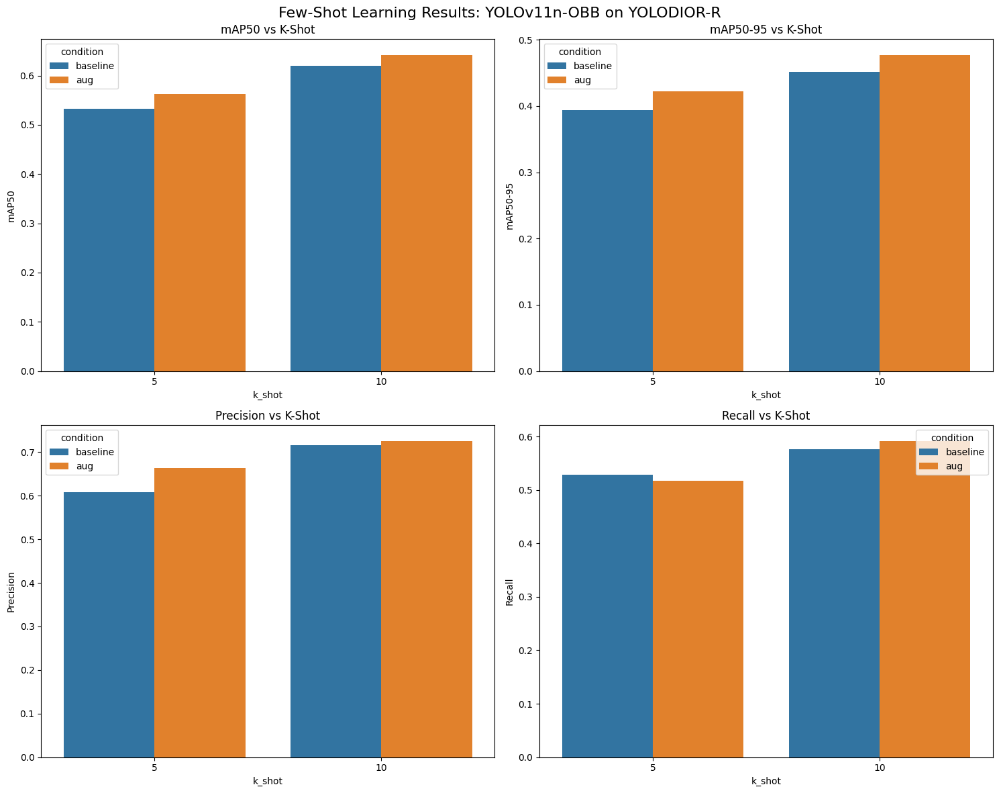


SUMMARY TABLE:
                   mAP50     mAP50-95     precision      recall    
                    mean std     mean std      mean std    mean std
k_shot condition                                                   
5      aug        0.5629 NaN   0.4219 NaN    0.6641 NaN  0.5166 NaN
       baseline   0.5326 NaN   0.3934 NaN    0.6085 NaN  0.5289 NaN
10     aug        0.6420 NaN   0.4770 NaN    0.7253 NaN  0.5915 NaN
       baseline   0.6199 NaN   0.4520 NaN    0.7155 NaN  0.5757 NaN

AUGMENTATION IMPACT:
5-shot: +5.68% improvement with augmentation
10-shot: +3.55% improvement with augmentation


,k_shot,seed,condition,mAP50,mAP50-95,precision,recall
0,5,0,baseline,0.532634,0.393383,0.608517,0.528926
1,5,0,aug,0.562883,0.421932,0.664072,0.516631
2,10,0,baseline,0.619948,0.451994,0.715461,0.575748
3,10,0,aug,0.641953,0.477007,0.725350,0.591525


In [30]:
analyze_results(experiment_results)

In [38]:
def convert_predictions_to_labels(model, img_path, conf_threshold=0.25):
    results = model.predict(img_path, conf=conf_threshold, save=False, verbose=False)
    labels = []
    
    if results and len(results) > 0 and hasattr(results[0], 'obb') and results[0].obb is not None:
        # lấy shape ảnh gốc
        H, W = results[0].orig_img.shape[:2]

        for detection in results[0].obb:
            class_id = int(detection.cls.item())
            if hasattr(detection, 'xyxyxyxy'):
                corners = detection.xyxyxyxy[0].cpu().numpy()   # (4,2) pixel
                # chuẩn hóa theo YOLO
                quad_norm = []
                for x, y in corners:
                    quad_norm.extend([x / W, y / H])
                labels.append((class_id, quad_norm))
    
    return labels

Testing 5shot_seed0_baseline_best
[(0, [0.20214038848876953, 0.4776237106323242, 0.20310047149658203, 0.41302837371826173, 0.11822860717773437, 0.41176692962646483, 0.11726852416992188, 0.4763622665405273]), (0, [0.2283751678466797, 0.17216772079467774, 0.22923683166503905, 0.04650234699249268, 0.09677977561950683, 0.04559412479400635, 0.09591813087463379, 0.1712594985961914]), (18, [0.4661041259765625, 0.40090579986572267, 0.46616195678710937, 0.35096263885498047, 0.44775100708007814, 0.35094127655029295, 0.44769317626953126, 0.40088443756103515]), (18, [0.5083190155029297, 0.16356195449829103, 0.5086222076416016, 0.1406178092956543, 0.4449922180175781, 0.1397768783569336, 0.44468902587890624, 0.1627210235595703]), (0, [0.9066573333740234, 0.7946644592285156, 0.9070735931396484, 0.7063609313964844, 0.8422766876220703, 0.7060554504394532, 0.8418604278564453, 0.7943589782714844]), (18, [0.4926203536987305, 0.25820863723754883, 0.49304622650146485, 0.2369869804382324, 0.4470230484008789,

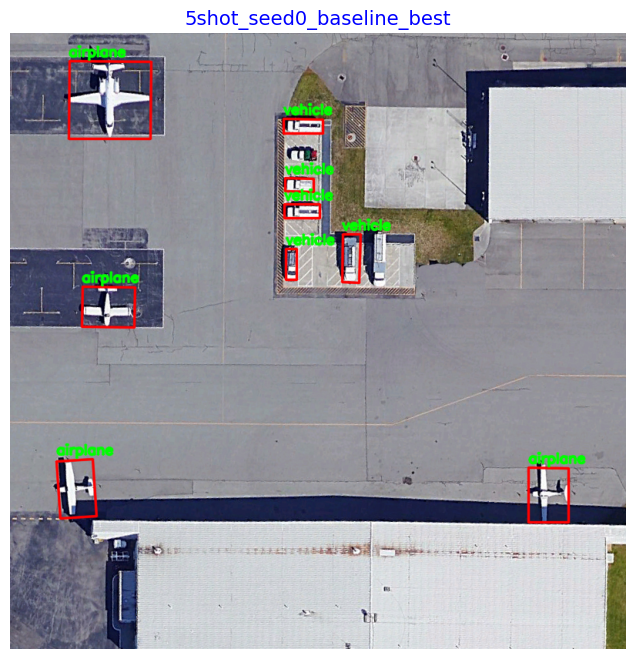

Testing 5shot_seed0_aug_best
[(0, [0.22472980499267578, 0.17386415481567383, 0.22828010559082032, 0.04786619186401367, 0.09877899169921875, 0.04421716690063476, 0.09522869110107422, 0.17021512985229492]), (0, [0.20036291122436523, 0.47480464935302735, 0.20178442001342772, 0.4122341537475586, 0.11821678161621094, 0.41033565521240234, 0.11679527282714844, 0.4729061508178711]), (18, [0.4453668212890625, 0.3007057571411133, 0.5014515686035156, 0.3000857162475586, 0.5012039184570313, 0.2776858520507812, 0.44511917114257815, 0.27830589294433594]), (18, [0.5067337799072266, 0.16205265045166015, 0.5071258544921875, 0.1406772804260254, 0.4470783233642578, 0.13957582473754881, 0.44668624877929686, 0.1609511947631836]), (18, [0.4481583404541016, 0.3978308868408203, 0.46628501892089846, 0.3976860046386719, 0.4659368896484375, 0.35412567138671874, 0.4478102111816406, 0.35427055358886717]), (0, [0.9061590576171875, 0.7894819641113281, 0.9062457275390625, 0.7024177551269531, 0.8498063659667969, 0.702

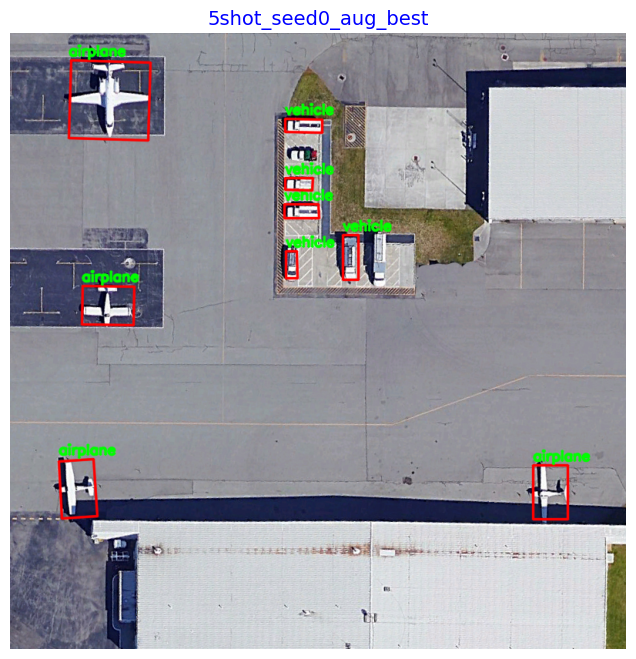

Testing 10shot_seed0_baseline_best
[(0, [0.22482534408569335, 0.17254812240600587, 0.22939260482788085, 0.047987170219421386, 0.09593619346618652, 0.04309373378753662, 0.0913689136505127, 0.1676546859741211]), (18, [0.442635498046875, 0.1625990104675293, 0.5077298736572265, 0.16224172592163086, 0.5076010131835937, 0.1387568950653076, 0.4425066375732422, 0.13911416053771972]), (18, [0.4678594970703125, 0.3998266220092773, 0.468359375, 0.3495101547241211, 0.44841102600097654, 0.3493119430541992, 0.44791114807128907, 0.3996284103393555]), (0, [0.20254138946533204, 0.4780593490600586, 0.2033833694458008, 0.4095278549194336, 0.11615092277526856, 0.4084560775756836, 0.1153089427947998, 0.47698757171630857]), (18, [0.4460183334350586, 0.30165609359741213, 0.5036019515991211, 0.30102197647094725, 0.5033449172973633, 0.27767850875854494, 0.44576129913330076, 0.27831262588500977]), (18, [0.49113002777099607, 0.25805858612060545, 0.4913068008422852, 0.23602542877197266, 0.4474410629272461, 0.2356

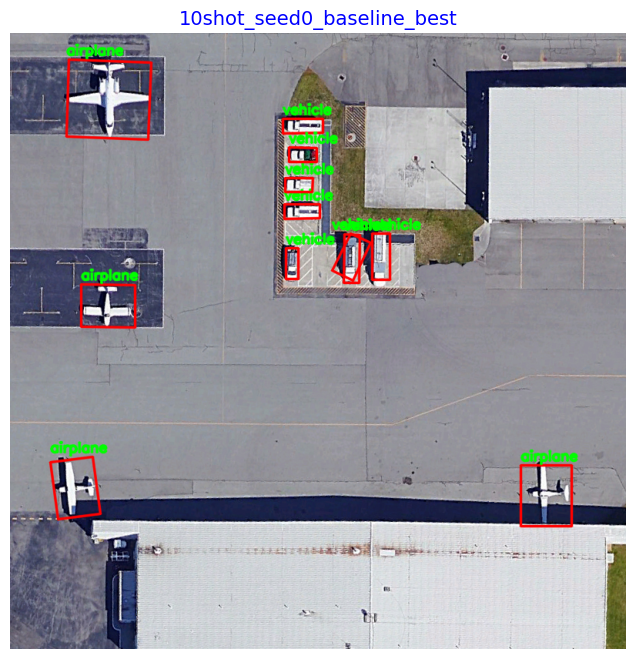

Testing 10shot_seed0_aug_best
[(0, [0.2009246253967285, 0.479592399597168, 0.20117078781127928, 0.4096334457397461, 0.1174509334564209, 0.4093388748168945, 0.11720475196838379, 0.4792978286743164]), (0, [0.22417402267456055, 0.16604677200317383, 0.22649221420288085, 0.04343404769897461, 0.10010637283325195, 0.04104452133178711, 0.09778818130493164, 0.16365724563598633]), (18, [0.4675448226928711, 0.3989448547363281, 0.46776859283447264, 0.35063461303710936, 0.4495866775512695, 0.35055038452148435, 0.44936290740966794, 0.3988606262207031]), (0, [0.0685340976715088, 0.7858474731445313, 0.143998384475708, 0.7857289123535156, 0.14385258674621582, 0.6929019165039062, 0.0683882999420166, 0.6930204772949219]), (0, [0.9107474517822266, 0.7965328979492188, 0.9110785675048828, 0.70089599609375, 0.8323198699951172, 0.7006233215332032, 0.8319887542724609, 0.7962602233886719]), (18, [0.5686410903930664, 0.4073247528076172, 0.5689587020874023, 0.32622116088867187, 0.5412704086303711, 0.3261127471923

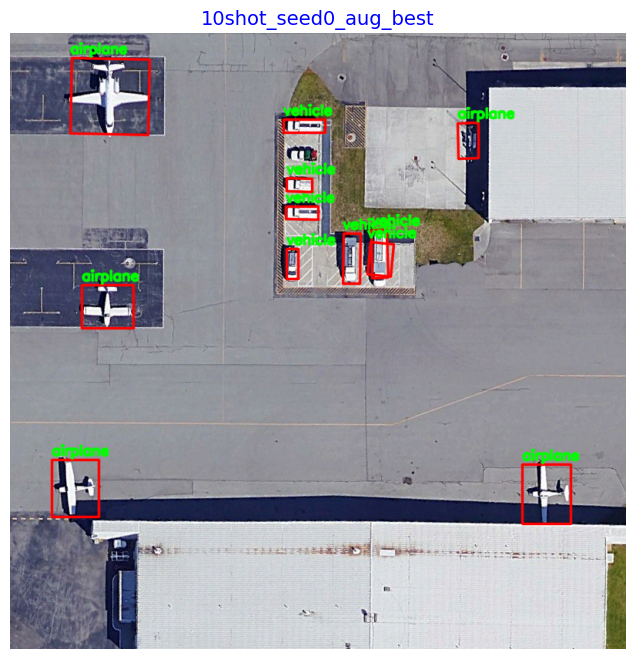

In [49]:
# Model comparison and visualization
models = []
if MODELS_DIR.exists():
    models = list(MODELS_DIR.glob("*.pt"))

# Test image
name_id = "00142"
img_path = YOLODIOR_ROOT / "test" / "images" / f"{name_id}.jpg"
original_img = cv2.imread(str(img_path))



for model_file in models:
    model_name = model_file.stem
    print(f"Testing {model_name}")
    
    model = YOLO(str(model_file))
    labels = convert_predictions_to_labels(model, str(img_path))
    print(labels)
    print(f"Detected: {len(labels)} objects")
    
    img_show(original_img.copy(), labels, hide_label=False, caption=model_name)
        
